In [ ]:
# install library for transfer learning
!pip install deeplc
!pip install pygam==0.8.0

In this tutorial you will learn how to predict the ACN (%B) concentration at which a peptide elude from the column. This can be useful in multiple project, for example, if annotation is lacking or when a gradient is designed to target specific (modified) peptides. Furthermore, the calculated ACN percentage can be used as a retention time normalized set that can be used to train new retention time prediction models, that should have higher performance as more training data is available.

In the first part of this notebook you will map retention times to ACN (%B). In the second part the gradient is predicted based on these ACN (%B) values. Then in the third, and last part, the ACN (%B) of peptide sequences mapped to the gradient are compared based on their reproducability in different PRIDE projects.

In [1]:
# Import default libs
import re
import os
import itertools
from collections import Counter
import pickle
import urllib.request
import warnings

# Import data libs
import pandas as pd

# Import DeepLC
from deeplc import DeepLC
from deeplc import FeatExtractor
from deeplcretrainer import deeplcretrainer

# ML
from pygam import LinearGAM, s, f
from sklearn.linear_model import LinearRegression

# TF
from tensorflow.python.eager import context
import tensorflow as tf

# Import plotting libs
import matplotlib
from matplotlib import pyplot as plt
import seaborn as sns

# Supress warnings (or at least try...)
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 
warnings.filterwarnings('ignore', category=DeprecationWarning)
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore')

# Set the dir of analysis
import numpy as np

In [2]:
# obtain three models for deeplc
urllib.request.urlretrieve(
    "https://github.com/RobbinBouwmeester/DeepLCModels/raw/main/full_hc_multretra_train_1fd8363d9af9dcad3be7553c39396960.hdf5?raw=true",
    "full_hc_multretra_train_1fd8363d9af9dcad3be7553c39396960.hdf5"
)

urllib.request.urlretrieve(
    "https://github.com/RobbinBouwmeester/DeepLCModels/raw/main/full_hc_multretra_train_8c22d89667368f2f02ad996469ba157e.hdf5?raw=true",
    "full_hc_multretra_train_8c22d89667368f2f02ad996469ba157e.hdf5"
)

urllib.request.urlretrieve(
    "https://github.com/RobbinBouwmeester/DeepLCModels/raw/main/full_hc_multretra_train_cb975cfdd4105f97efa0b3afffe075cc.hdf5?raw=true",
    "full_hc_multretra_train_cb975cfdd4105f97efa0b3afffe075cc.hdf5"
);

First we will create some generic functions that will be used throughout this notebook:

In [3]:
def get_peprec_str(
        mseq: str) -> str:
    """
    Parses MaxQuant format of modified peptide sequences to peprec.

    Parameters
    ----------
    mseq : str
        MaxQuant version of a modified sequence with the 
        modification in brackets within this sequence
        
    Returns
    -------
    str
        peprec format for modified sequence
    """
    mseq = mseq.replace("))",")")
    read_seq = True
    temp_mod = ""
    pos = 0
    all_mods = []
    for char_seq in mseq:
        if char_seq == "(":
            read_seq = False
            continue
        if char_seq == ")":
            read_seq = True
            all_mods.append(str(pos))
            all_mods.append(str(temp_mod.split(" ")[0]))
            temp_mod = ""
            continue

        if not read_seq:
            temp_mod += char_seq
        else:
            pos += 1
    return "|".join(all_mods)


def apply_deeplc(
        evids: pd.DataFrame,
        models: list = [
            "full_hc_multretra_train_1fd8363d9af9dcad3be7553c39396960.hdf5",
            "full_hc_multretra_train_cb975cfdd4105f97efa0b3afffe075cc.hdf5",
            "full_hc_multretra_train_8c22d89667368f2f02ad996469ba157e.hdf5"
        ]) -> pd.DataFrame:
    """
    Gets and prints the spreadsheet's header columns

    Parameters
    ----------
    evids : pd.DataFrame
        Pandas dataframe containing the peptides to predict the retention time for,
        the dataframe is in peprec format. With the columns "seq", "modifications",
        and "tr"
    models : list
        List of strings with filenames (location relative to cwd)
        
    Returns
    -------
    pd.DataFrame
        Pandas dataframe containing the peptides with their respective
        predicted retention time. The dataframe is in peprec format. With the 
        columns "seq", "modifications", "tr", and "uncal_preds" for the 
        predictions
    """
    dlc = DeepLC(path_model=models)
    uncal_preds = dlc.make_preds(seq_df=evids,calibrate=False)
    
    evids["uncal_preds"] = uncal_preds

    return evids


def get_grad(
        evids: pd.DataFrame,
        sel_file: str = "2022-8-29_Ecoli_130min",
        slope: float = 0,
        intercept: float = 0,
        filter_intens: bool =True,
        prep_deeplc: bool =True
    ) -> pd.DataFrame:
    """
    Obtain percentage B via retention time predictions

    Parameters
    ----------
    evids : pd.DataFrame
        Pandas dataframe containing the peptides to predict the retention time for,
        the dataframe is in peprec format. With the columns "seq", "modifications",
        and "tr"
    sel_file : str
        run name in the column "Raw file" of the evids dataframe
    slope : float
        Slope of the function that goes from uncalibrated predictions to %B
    intercept : float
        Intercept of the function that goes from uncalibrated predictions to %B
    filter_intens : Boolean
        Filter duplicate PSMs by their intensity, most intense is kept
    prep_deeplc : Boolean
        If the evids dataframe needs any preprocessing, on, for example, the
        sequence level to go from MaxQuant to peprec.
        
        
    Returns
    -------
    pd.DataFrame
        Pandas dataframe containing the peptides with their respective
        predicted retention time. The dataframe is in peprec format. With the 
        columns "seq", "modifications", "tr", "uncal_preds" for the 
        predictions, and "perc_b" for the %B estimate
    """
    if len(sel_file) > 0:
        evids = evids[evids["Raw file"] == sel_file]
    
    if filter_intens:
        evids = evids.sort_values("Intensity",ascending=False).drop_duplicates("Modified sequence",keep="first")
    
    if prep_deeplc:
        evids["modifications"] = evids["Modified sequence"].apply(get_peprec_str)
        evids["seq"] = evids["Sequence"]
        evids["tr"] = evids["Calibrated retention time"]
        
    evids = apply_deeplc(evids)

    evids["perc_b"] = evids["uncal_preds"]*slope+intercept

    return evids


def fit_pygam(
        evids_x: np.array,
        evids_y: np.array,
        slope: float = 6.862505823849247,
        intercept: float = -12.565282228324486,
        n_splines: int = 150,
        verbose: bool = False,
        constraints: str = "None"
    ) -> LinearGAM:
    """
    Obtain percentage B via predictions

    Parameters
    ----------
    evids_x : np.array
        The feature vector containing floats
    evids_y : np.array
        The target vector containing floats
    slope : float
        Slope of the function that goes from uncalibrated predictions to %B
    intercept : float
        Intercept of the function that goes from uncalibrated predictions to %B
    n_splines : int
        numbter of splines to use for the model
    verbose : Boolean
        Set verbosity of the pygam
    constraints : str
        Constraints of the pygam, see pygam documentation for details
        
        
    Returns
    -------
    LinearGAM
        LinearGAM object that can map between predictions and %B
    """
    splines = s(0, n_splines=n_splines)
    
    gam_model = LinearGAM(splines, constraints=constraints, verbose=verbose)
   
    gam_model.fit(
            evids_x,
            evids_y*slope+intercept
    )
    
    return gam_model

def sanatize_input(seq: str) -> str:
    """
    Sanatize the input so that no peptide sequence contains any 
    lowercase characters. Although this is used for modifications
    currently we do not account for this.

    Parameters
    ----------
    seq : str
        string to be sanatized of the peptide sequence
        
    Returns
    -------
    seq : str
        sanatized peptide sequence string
    """
    return "".join([c for c in  seq if not c.islower()])

def robust_pygam(
        evids: pd.DataFrame,
        num_iter: int = 10,
        percentile_keep: float = 95.0,
        constraints: str = "monotonic_inc",
        n_splines: int = 50
    ) -> (pd.DataFrame,pd.DataFrame,LinearGAM):
    """
    Perform a fit between uncalibrated predictions and retention times. Then
    every peptide over a certain error threshold is thrown out for x number
    of iterations.

    Parameters
    ----------
        evids : pd.DataFrame
        Pandas dataframe containing the peptides to predict the retention time for,
        the dataframe is in peprec format. With the columns "seq", "modifications",
        "tr", and "uncal_preds" for the uncalibrated predictions
    num_iter : int
        Number of times a new regression model is fitted and additional outliers
        removed.
    percentile_keep : float
        Percentile of lowest errors to keep in each round, range of [0,100]
    n_splines : int
        numbter of splines to use for the model
    constraints : str
        Constraints of the pygam, see pygam documentation for details
        
        
    Returns
    -------
    pd.DataFrame
        Dataframe with all peptidoforms kept
    pd.DataFrame
        Dataframe with all peptidoforms removed after robust 
    LinearGam
        LinearGAM object that can map between predictions and %B
    """
    evids_higher = []
    
    for i in range(num_iter):
        gam_model = LinearGAM(s(0, n_splines=n_splines), 
                              constraints=constraints, 
                              verbose=True).fit(
                                                evids["uncal_preds"],
                                                evids["tr"], 
                             )

        errors = abs(evids["tr"]-gam_model.predict(evids["uncal_preds"]))/(max(evids["tr"])-min(evids["tr"]))
        percentile_error = np.percentile(errors,percentile_keep)

        evids_higher.append(evids[errors >= percentile_error])
        evids = evids[errors < percentile_error]

    evids_higher = pd.concat(evids_higher)
    
    return evids, evids_higher, gam_model


Next we will download retention time data sets from ProteomicsML. These data sets have been previously submitted to PRIDE together with the evidence file obtained with MaxQuant.

In [4]:
combined_df = pd.read_csv(
    "https://github.com/ProteomicsML/ProteomicsML/raw/combined_datasets_retention_time/datasets/retentiontime/PRIDE_MQ/PRIDE_MQ.zip?raw=true",
    compression="zip",
    low_memory=False
)

First we will sort all values on their respective retention times. Although we have multiple projects mixed in, by sorting the whole dataframe we can slice out a sorted single project. Then we sanatize the input for lowercase characters in the peptide sequence (indicate modifications) as DeepLC is not able to encode these correctly.

In [5]:
combined_df.sort_values("tr",inplace=True)
combined_df.fillna("",inplace=True)
combined_df["seq"] = combined_df["seq"].apply(sanatize_input)

Lets count the number of projects and associated peptide sequences:

In [6]:
combined_counter = Counter(combined_df["project"])
print(f"Number of different projects: {len(combined_counter.keys())}")

Number of different projects: 133


This is the top 10 projects with the most peptide sequences:

In [7]:
combined_counter.most_common()[0:10]

[('PXD028028_A_G_I', 148501),
 ('PXD020019', 98447),
 ('PXD010606_IB', 94779),
 ('PXD023559', 91220),
 ('PXD034196_pro', 88077),
 ('PXD030406', 87908),
 ('PXD019362', 87493),
 ('PXD022614', 86643),
 ('PXD034187_pro', 74438),
 ('PXD021742', 74035)]

The bottom 10 projects with the least amount of peptide sequences:

In [8]:
combined_counter.most_common()[-10:]

[('PXD024045', 21399),
 ('PXD005346_HeLa_pAA_Rep2', 21112),
 ('PXD020987_third_batch', 20890),
 ('PXD023679', 20837),
 ('PXD022149', 20671),
 ('PXD028125', 20636),
 ('PXD012891', 20531),
 ('PXD010248', 20274),
 ('PXD019957', 20267),
 ('PXD002549', 20175)]

In the next piece of code we can filter down on the largest or smallest projects. In this example we will include all projects, but feel free to narrow down to just a few if computational time is too long.

In [9]:
# To change the projects selected replace 'combined_counter.most_common()' with
# one of the pieces of code below in the comments:
#
# All projects: combined_counter.most_common()
# The 50 smallest projects: combined_counter.most_common()[-50:]
# The 50 largest projects: combined_counter.most_common()[50:]

selected_projects = [s[0] for s in combined_counter.most_common()] 
combined_df = combined_df[combined_df["project"].isin(selected_projects)]

In a seperate analysis we have determined the slope and intercept of how to map predictions from predicted retention times to their respective ACN (%B). This was possible by running an experiment with known gradients. Then the peptide standards were identified in the runs. The identifications have observed retention times and we also predicted retention times with DeepLC. The predicted retention time can be mapped to observed retention times, and these observed values can be in turn mapped to a known ACN (%B). As a result any retention time prediction can be mapped to an ACN (%B) value. Since this mapping was performed with a linear gradient we can define a simple linear equation in the form of: y = ax + b

In [10]:
slope=5.504625178023647
intercept=-10.391891124589618

In this equation the 'x' is the predicted retention time, so in the next cell we predict retention times for all peptide sequences. After predicting the retention time we apply the linear equation above and map them to ACN (%B).

In [11]:
combined_evids = get_grad(
            combined_df,
            sel_file="",
            slope=slope,
            intercept=intercept,
            filter_intens=False,
            prep_deeplc=False
        )

22/22 [==============================] - 3s 130ms/step


While we have an ACN (%B) value now for each peptide sequence these contain still contain the error of the models used to predict the retention time. We can attempt to lower this by taking the surrounding peptides with similar retention time into account. An LC gradient has several constraints such as increasing over time and peptides with a similar retention time should have similar ACN (%B). We can use these constraints to predict the gradient and map the retention times (with associated peptide sequences) onto this predicted constrained gradient.

<Figure size 1800x480 with 0 Axes>

Analyzing this project (1/133): PXD026842
Analyzing this project (2/133): PXD028028_A_G_I
Analyzing this project (3/133): PXD019362


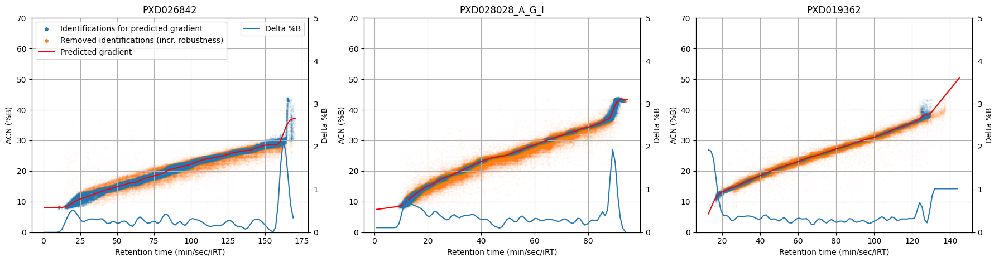

Analyzing this project (4/133): PXD010576
Analyzing this project (5/133): PXD020987_second_batch
Analyzing this project (6/133): PXD035547


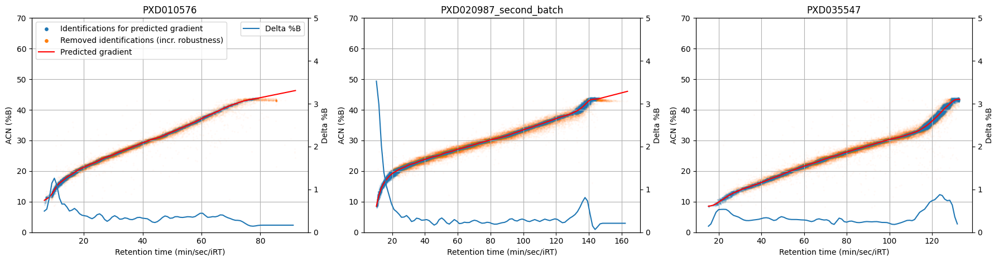

Analyzing this project (7/133): PXD024127_SETD3_mutants
Analyzing this project (8/133): PXD028125
Analyzing this project (9/133): PXD019704


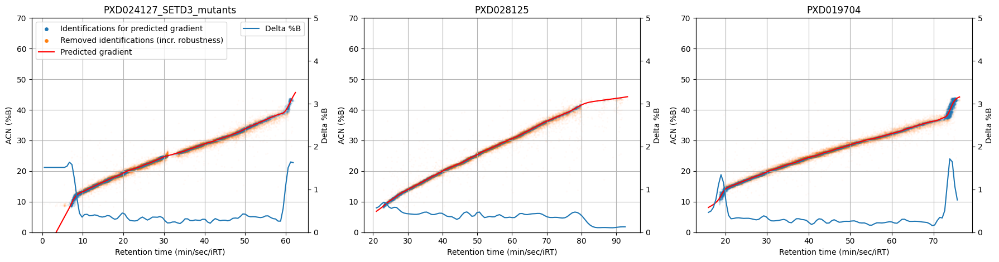

Analyzing this project (10/133): PXD034196_pro
Analyzing this project (11/133): PXD030003_6GRevidence.txt_new.csv_deeplcready.csv
Analyzing this project (12/133): PXD020805


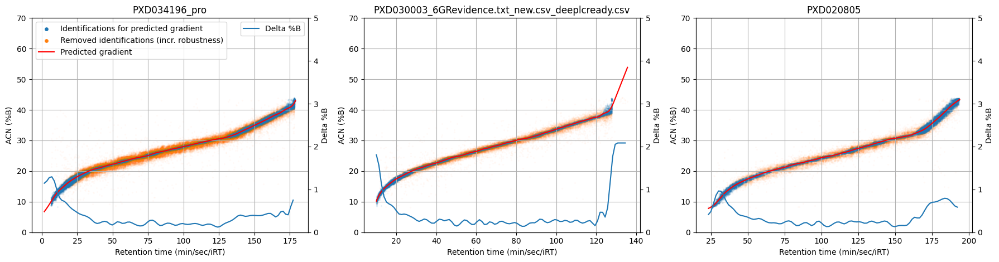

Analyzing this project (13/133): PXD022525
Analyzing this project (14/133): PXD020759_MQ
Analyzing this project (15/133): PXD022614


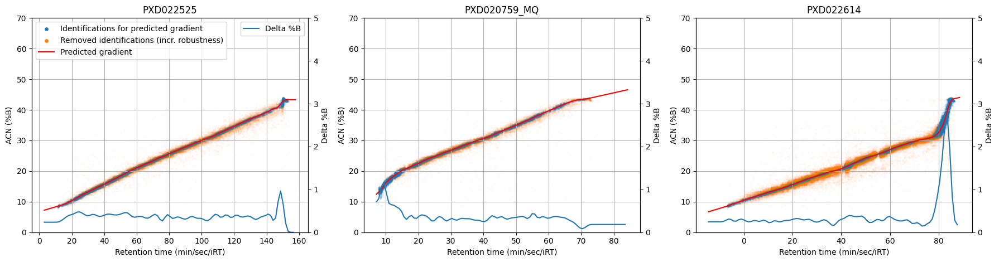

Analyzing this project (16/133): PXD010606_IB
Analyzing this project (17/133): PXD023559
Analyzing this project (18/133): PXD012121


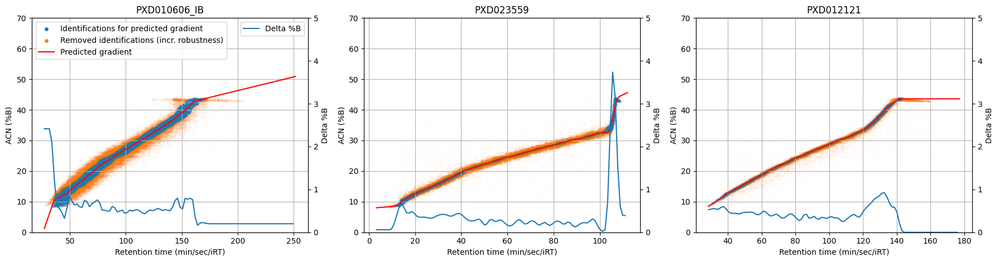

Analyzing this project (19/133): PXD026072
Analyzing this project (20/133): PXD025503
Analyzing this project (21/133): PXD029747_LCL


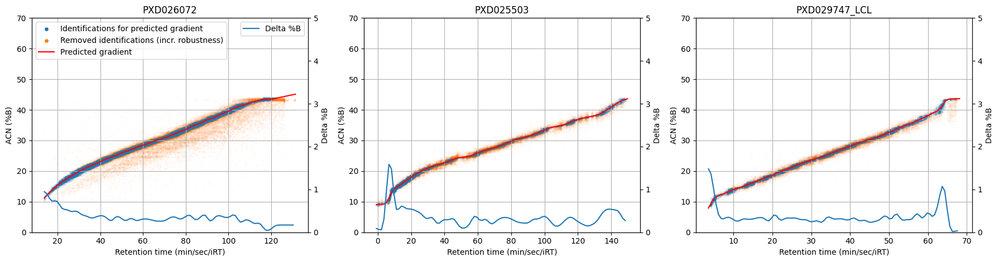

Analyzing this project (22/133): PXD026844
Analyzing this project (23/133): PXD025792
Analyzing this project (24/133): PXD020987_third_batch


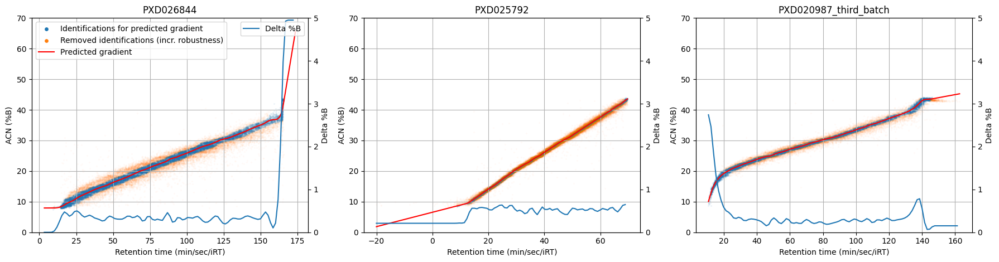

Analyzing this project (25/133): PXD002549
Analyzing this project (26/133): PXD033763_Ubi
Analyzing this project (27/133): PXD020812_Fast


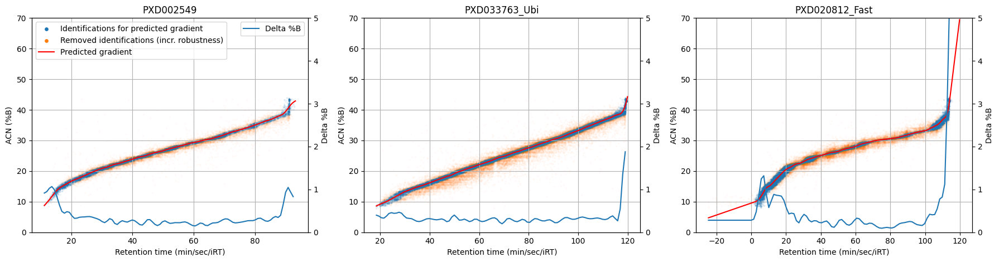

Analyzing this project (28/133): PXD021437
Analyzing this project (29/133): PXD018387
Analyzing this project (30/133): PXD026805


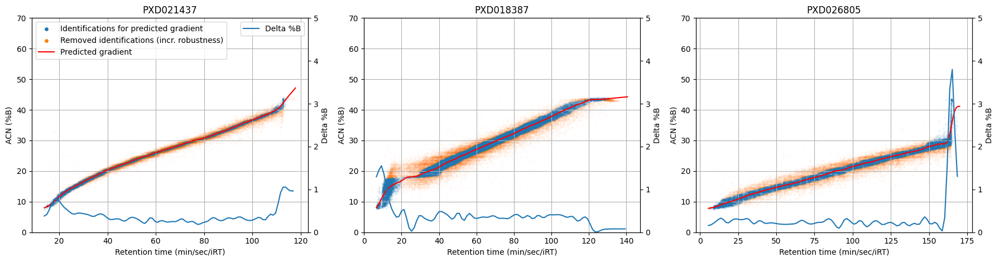

Analyzing this project (31/133): PXD022149
Analyzing this project (32/133): PXD034517
Analyzing this project (33/133): PXD033763_FullProt


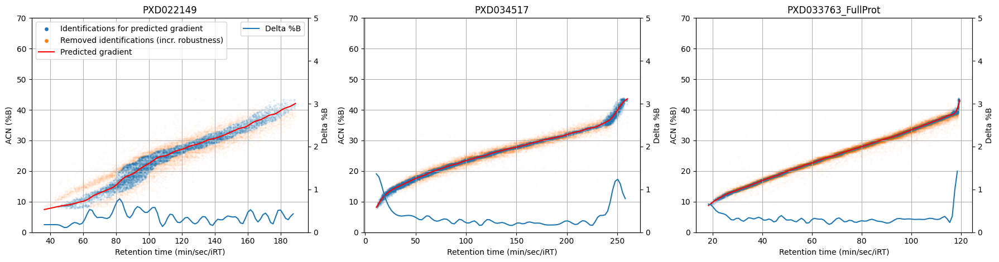

Analyzing this project (34/133): PXD026804_MS18-172
Analyzing this project (35/133): PXD019957
Analyzing this project (36/133): PXD019254


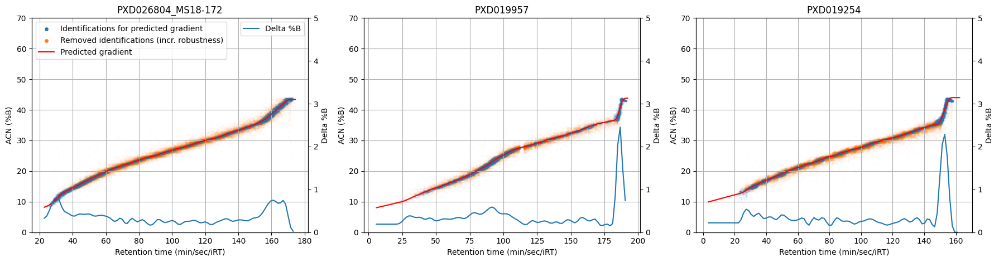

Analyzing this project (37/133): PXD016675
Analyzing this project (38/133): PXD012891
Analyzing this project (39/133): PXD022962


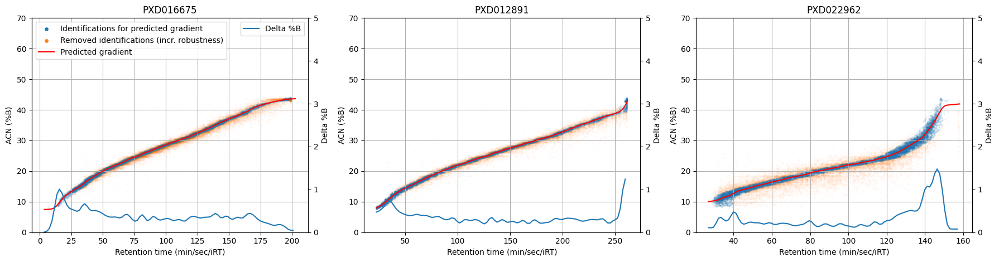

Analyzing this project (40/133): PXD010248
Analyzing this project (41/133): PXD032893_TPN53
Analyzing this project (42/133): PXD016750


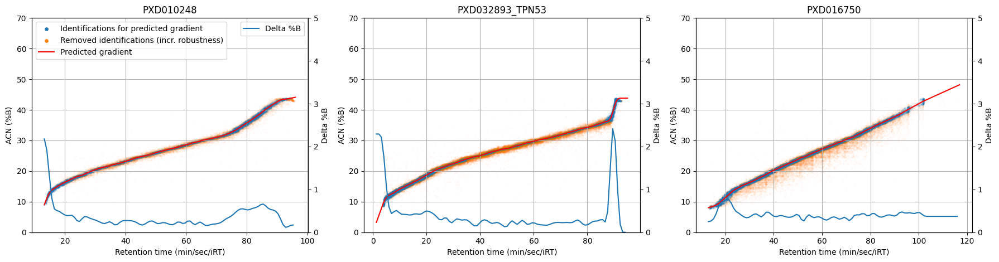

Analyzing this project (43/133): PXD011545
Analyzing this project (44/133): PXD020996_kidney
Analyzing this project (45/133): PXD026894


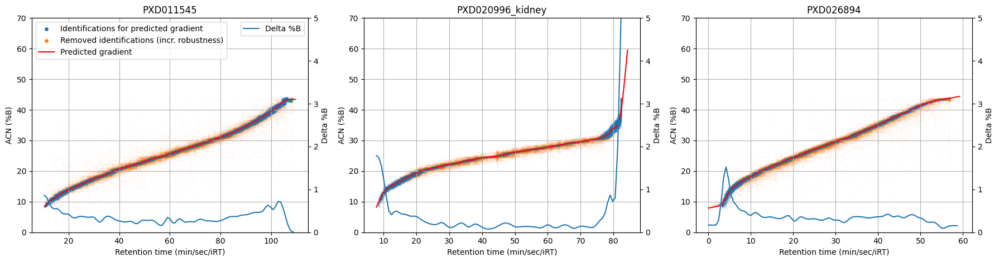

Analyzing this project (46/133): PXD020686
Analyzing this project (47/133): PXD030406
Analyzing this project (48/133): PXD031378


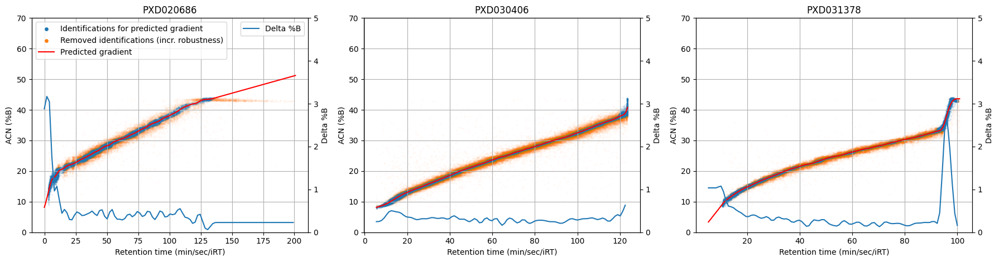

Analyzing this project (49/133): PXD012332
Analyzing this project (50/133): PXD013738
Analyzing this project (51/133): PXD008599


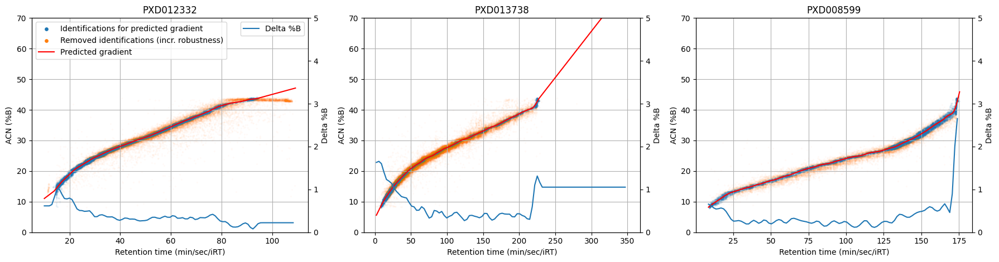

Analyzing this project (52/133): PXD018584
Analyzing this project (53/133): PXD022492
Analyzing this project (54/133): PXD024093


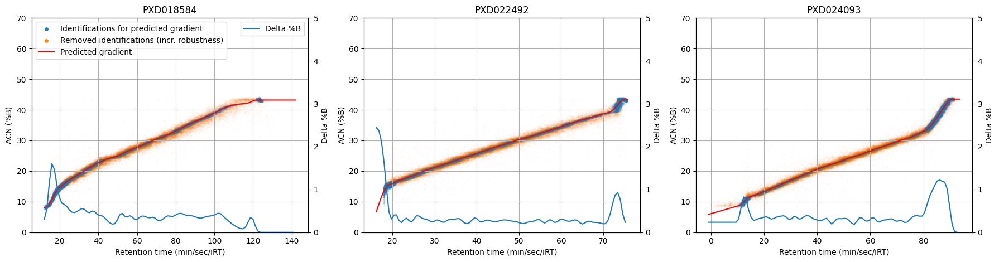

Analyzing this project (55/133): PXD014247
Analyzing this project (56/133): PXD021507
Analyzing this project (57/133): PXD020019


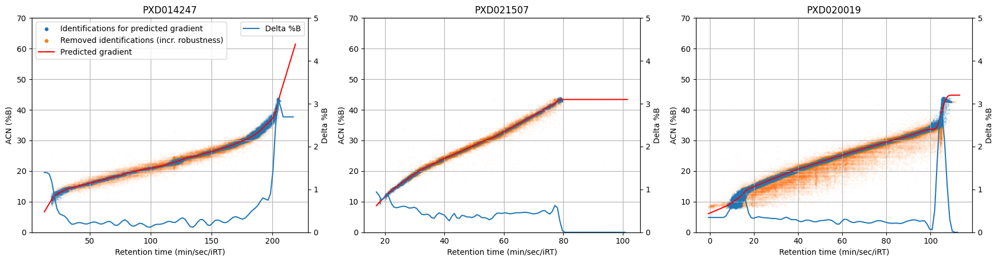

Analyzing this project (58/133): PXD020974_biliary_atresia
Analyzing this project (59/133): PXD024782
Analyzing this project (60/133): PXD031936_ONA13056


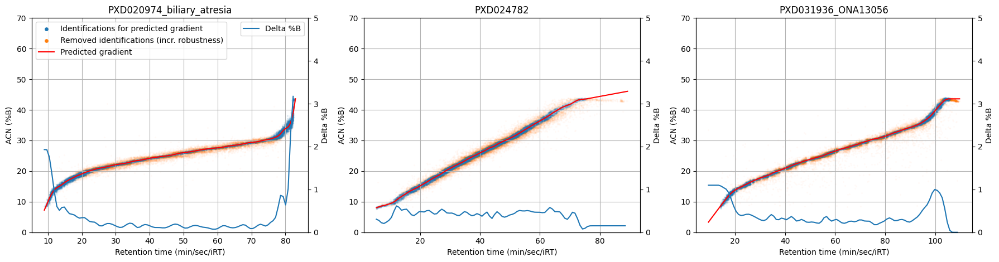

Analyzing this project (61/133): PXD020303
Analyzing this project (62/133): PXD032958
Analyzing this project (63/133): PXD023852


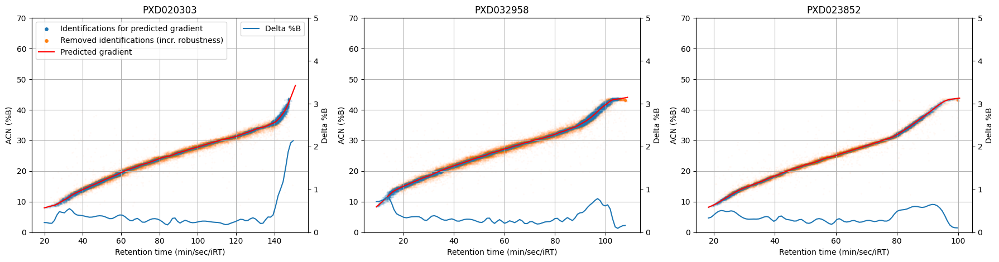

Analyzing this project (64/133): PXD034187_pro
Analyzing this project (65/133): PXD023679
Analyzing this project (66/133): PXD030003_CarbonSourceevidence.txt_new.csv_deeplcready.csv


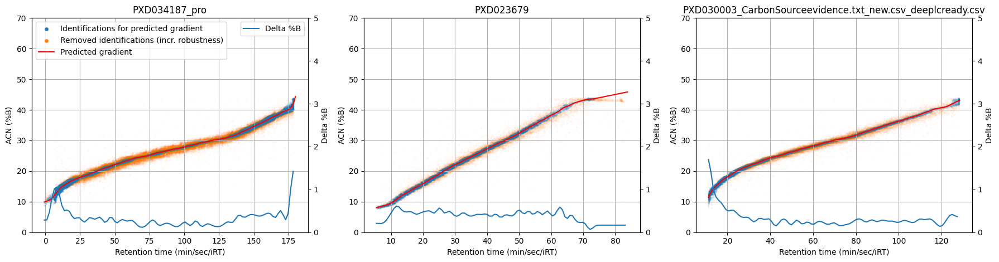

Analyzing this project (67/133): PXD021742
Analyzing this project (68/133): PXD021360
Analyzing this project (69/133): PXD016003


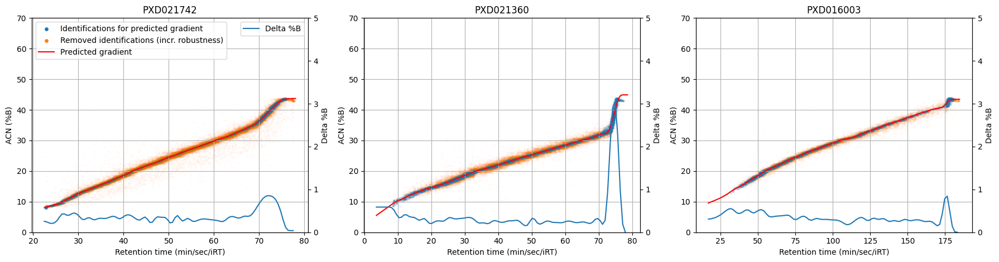

Analyzing this project (70/133): PXD021630
Analyzing this project (71/133): PXD005499
Analyzing this project (72/133): PXD026857


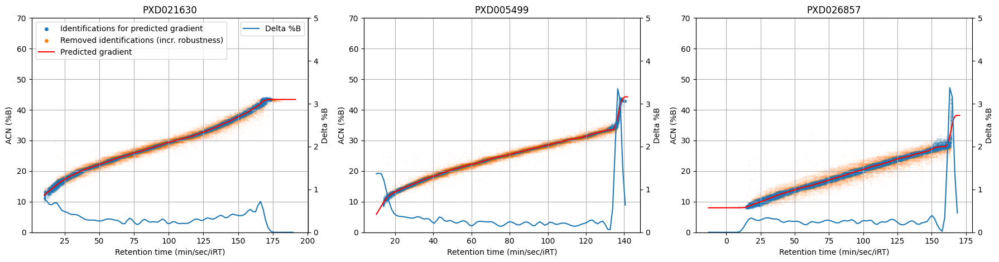

Analyzing this project (73/133): PXD017821
Analyzing this project (74/133): PXD016565
Analyzing this project (75/133): PXD015453


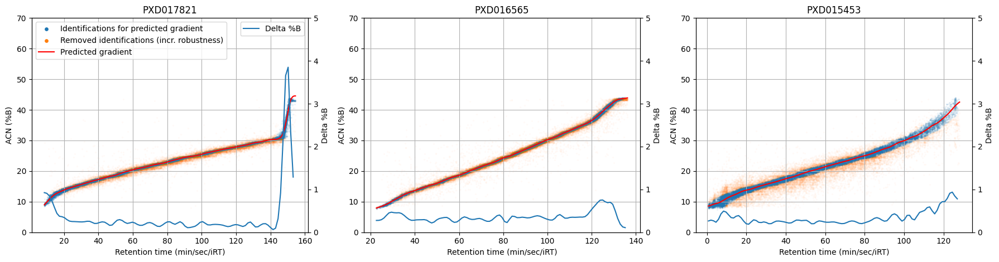

Analyzing this project (76/133): PXD019929
Analyzing this project (77/133): PXD029668
Analyzing this project (78/133): PXD005751


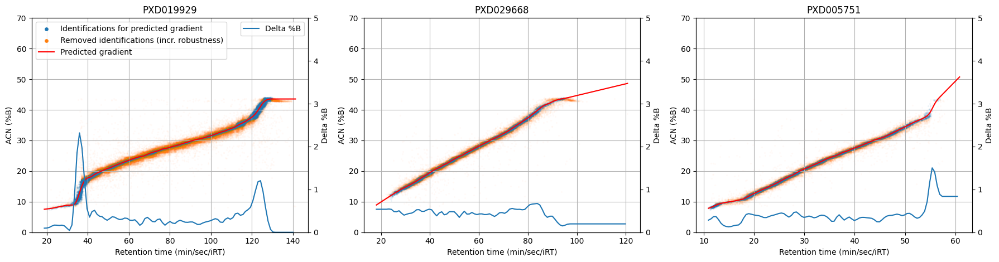

Analyzing this project (79/133): PXD030003_Cycloevidence.txt_new.csv_deeplcready.csv
Analyzing this project (80/133): PXD028992
Analyzing this project (81/133): PXD005346_HeLa_pAA_Rep3


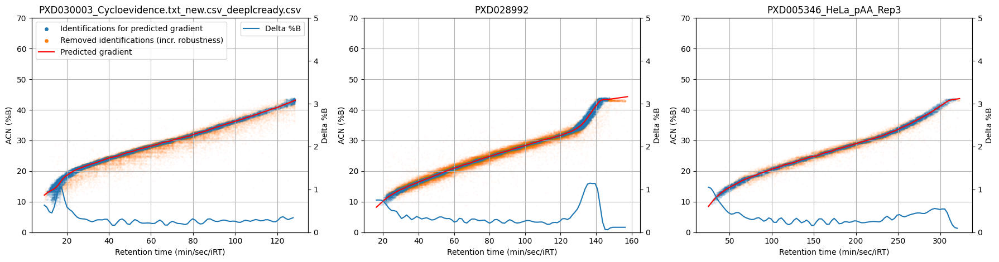

Analyzing this project (82/133): PXD019545
Analyzing this project (83/133): PXD021924_20210202_H1975_H460
Analyzing this project (84/133): PXD019074


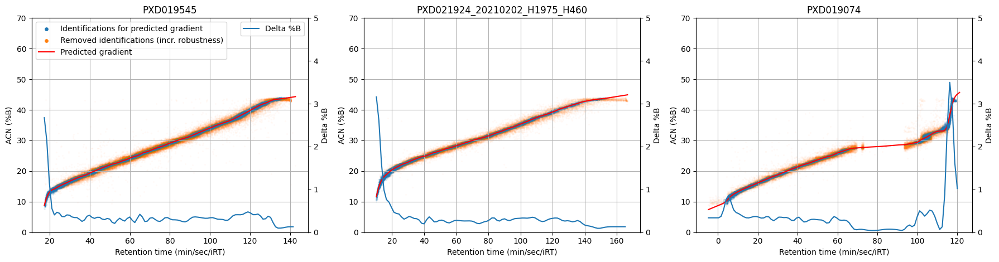

Analyzing this project (85/133): PXD020491
Analyzing this project (86/133): PXD024872_RanBPMdiGLY
Analyzing this project (87/133): PXD010133


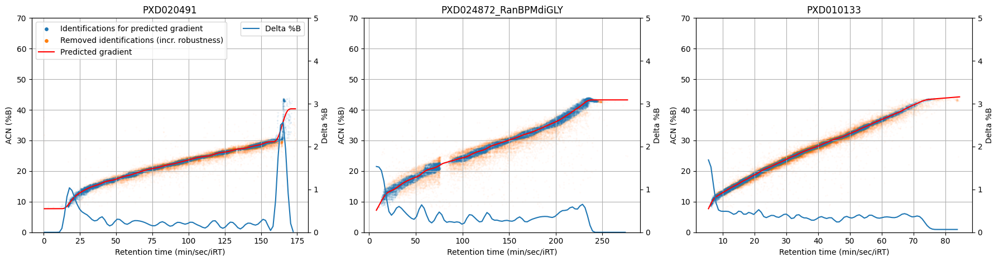

Analyzing this project (88/133): PXD010098
Analyzing this project (89/133): PXD012584
Analyzing this project (90/133): PXD026824


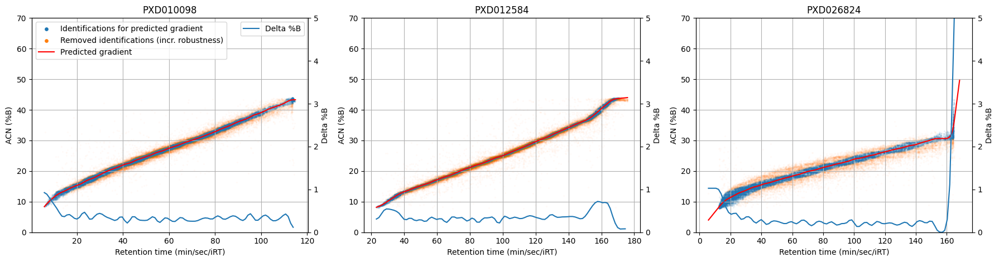

Analyzing this project (91/133): PXD023239
Analyzing this project (92/133): PXD030309
Analyzing this project (93/133): PXD025258


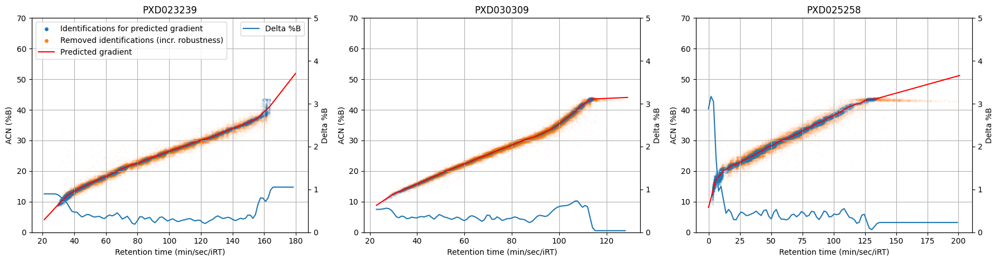

Analyzing this project (94/133): PXD020559
Analyzing this project (95/133): PXD029290
Analyzing this project (96/133): PXD022752


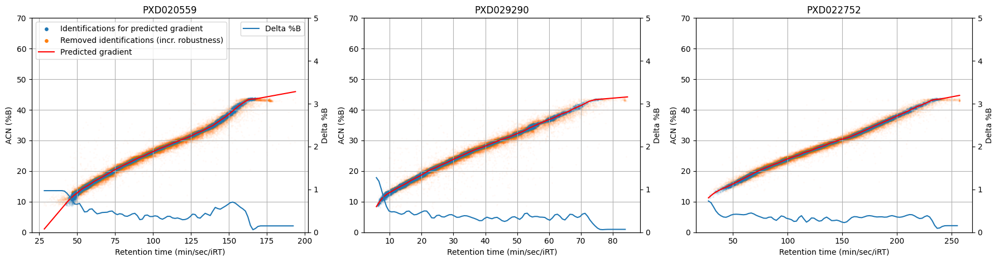

Analyzing this project (97/133): PXD021882
Analyzing this project (98/133): PXD023595
Analyzing this project (99/133): PXD005346_HeLa_pAA_Rep2


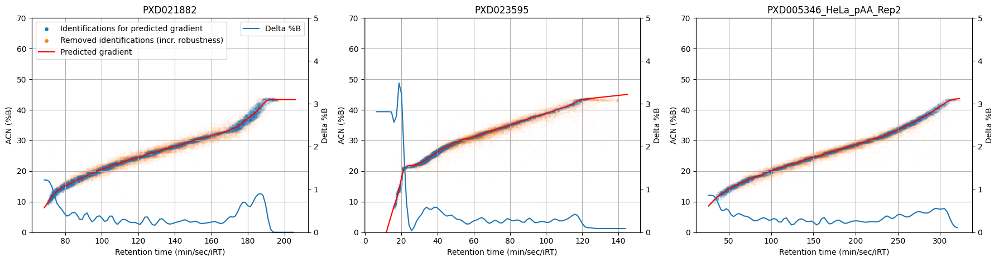

Analyzing this project (100/133): PXD032041
Analyzing this project (101/133): PXD019252
Analyzing this project (102/133): PXD031921


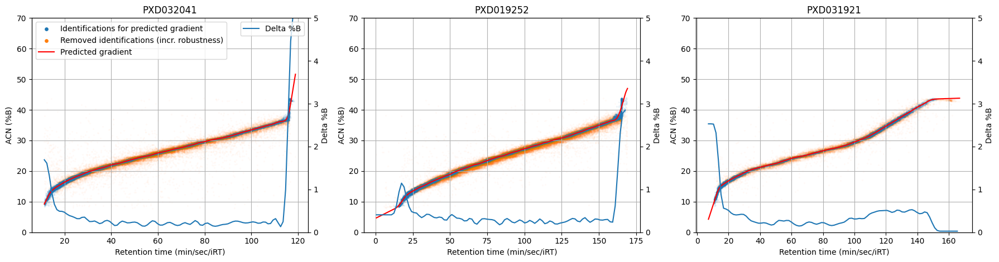

Analyzing this project (103/133): PXD021359
Analyzing this project (104/133): PXD020760
Analyzing this project (105/133): PXD020812_SuperFast


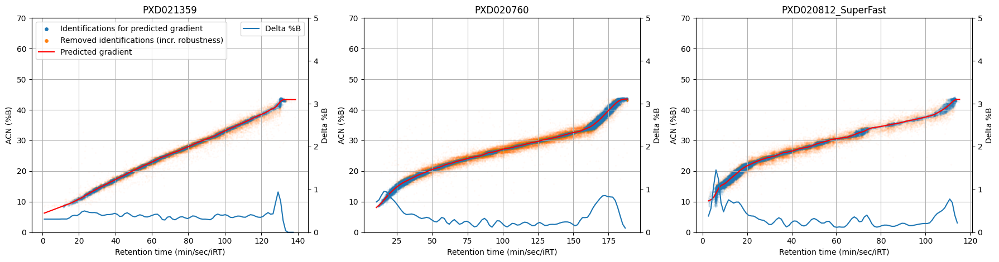

Analyzing this project (106/133): PXD005766
Analyzing this project (107/133): PXD018422
Analyzing this project (108/133): PXD026085


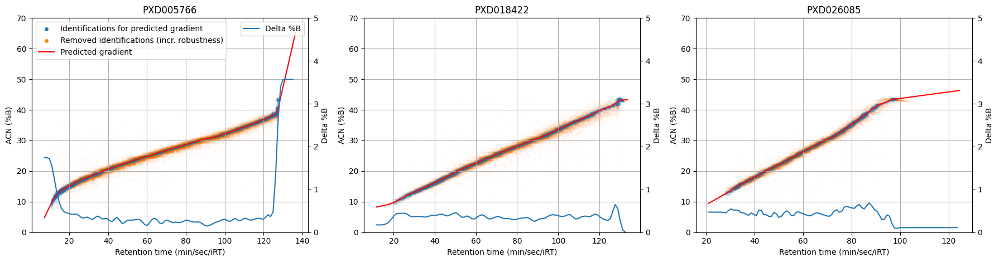

Analyzing this project (109/133): PXD028526
Analyzing this project (110/133): PXD024045
Analyzing this project (111/133): PXD030729_SH-APEX2


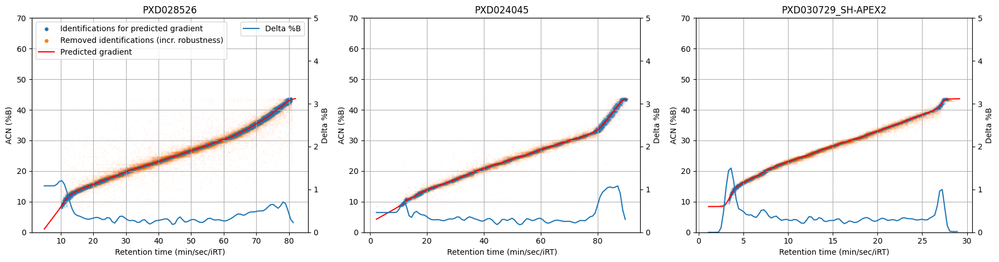

Analyzing this project (112/133): PXD022759_OBIKA
Analyzing this project (113/133): PXD026713
Analyzing this project (114/133): PXD020987_first_batch


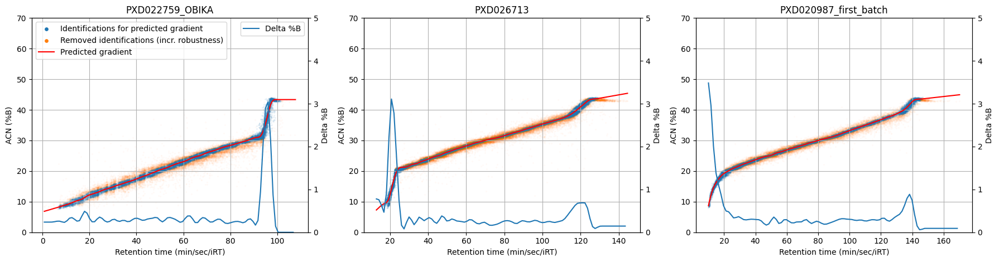

Analyzing this project (115/133): PXD024193_MaxQuant
Analyzing this project (116/133): PXD025626
Analyzing this project (117/133): PXD020939_Netherlands


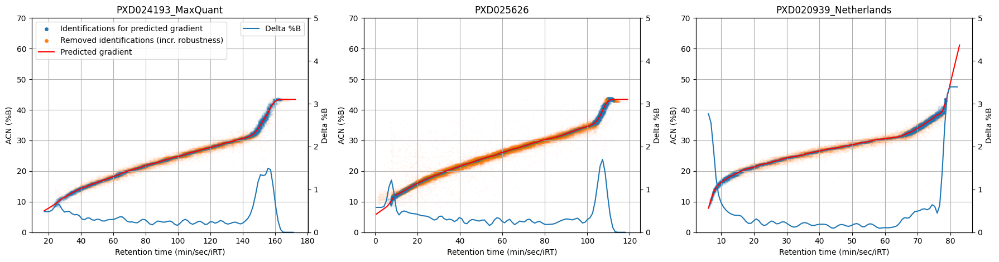

Analyzing this project (118/133): PXD013923
Analyzing this project (119/133): PXD012147
Analyzing this project (120/133): PXD021924_20210208_H1944


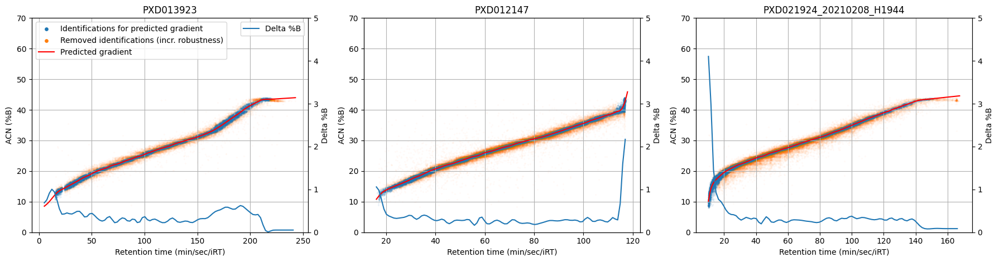

Analyzing this project (121/133): PXD028925
Analyzing this project (122/133): PXD021540
Analyzing this project (123/133): PXD026057


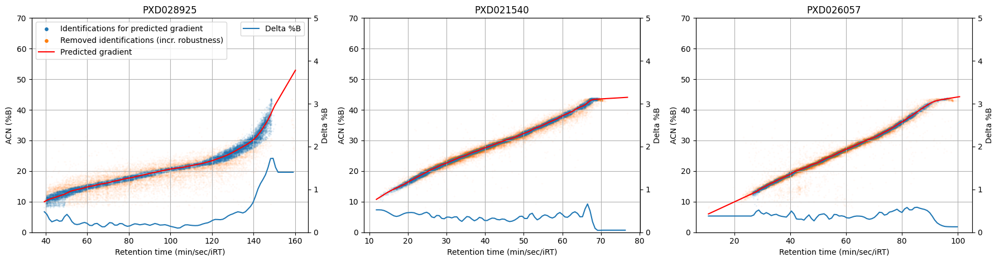

Analyzing this project (124/133): PXD005271
Analyzing this project (125/133): PXD025980
Analyzing this project (126/133): PXD028034


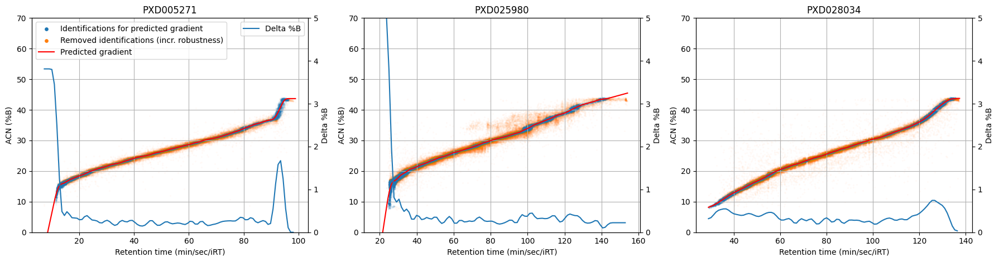

Analyzing this project (127/133): PXD022909
Analyzing this project (128/133): PXD021924_20190315_HFX_p335_phospho
Analyzing this project (129/133): PXD018253


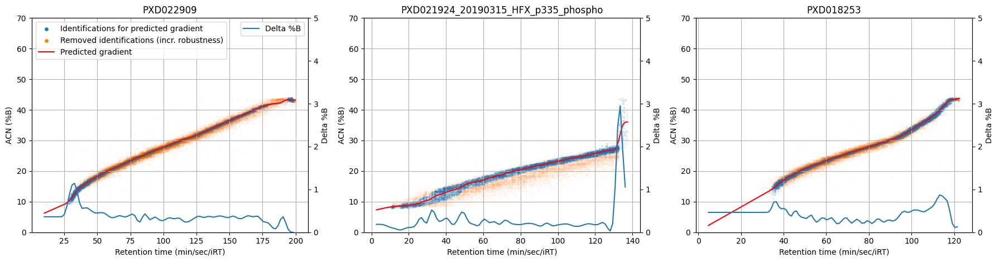

Analyzing this project (130/133): PXD031936_ONA11883
Analyzing this project (131/133): PXD013307
Analyzing this project (132/133): PXD008726


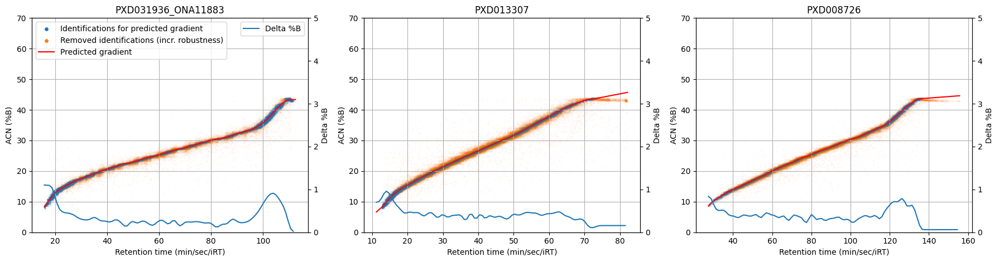

Analyzing this project (133/133): PXD020222


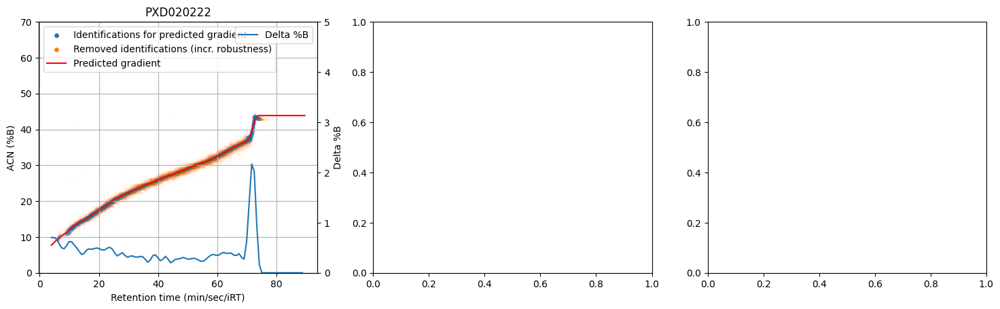

In [12]:
%matplotlib inline

# Define some of the parameters to predict the gradient
verbose = True
plot_emp_derivative = True
n_splines = 50

# Define the plotting area for our predicted gradient
matplotlib.rcParams['figure.figsize'] = [18, 4.8]

# Get a list of all projects we need to iterate over
all_projects = list(set(combined_df["project"]))

# Define a list with locations of each project in three subplot to be plotted
iter_row_nums = [i % 3 for i in range(0,len(list(set(combined_df["project"]))))]

# Iterate over each project and plot location
for sum_idx,(proj,idx) in enumerate(zip(all_projects,iter_row_nums)):
    # If we start with a new plot show the results and prepare a new subplot
    if idx == 0:
        plt.tight_layout()
        plt.show()
        plt.close()
        fig, axs = plt.subplots(1, 3)
        
    if verbose:
        print(f"Analyzing this project ({sum_idx+1}/{len(all_projects)}): {proj}")
    
    # Grab the correct subplot
    ax = axs[idx]
    
    # Get all information for the selected project
    evids_all = combined_evids[combined_evids["project"] == proj]
    
    # Fit a robust regression model (GAM with splines) to map between observed
    # retention times and predicted ACN (%B). This will iteratively fit a regression
    # model and exclude the peptide sequences with the largest error (evids_higher).
    # This ensure we only give weight to those peptide sequences with that are 
    # predicted the most accurately. You can exclude this step, but beware that many
    # observations are noisy (wrong apex) or plain wrong (wrong identification).
    evids, evids_higher, pygam_model = robust_pygam(evids_all,n_splines=n_splines)

    # Fit a regression model (GAM with splines) on the most accurately predicted
    # peptide sequences. This model maps between (uncalibrated) predictions with
    # associated ACN (%B) and observed retention time.
    mod_pygam = fit_pygam(
                    evids["tr"],
                    evids["uncal_preds"],
                    slope=slope,
                    intercept=intercept,
                    n_splines=n_splines,
                    constraints="monotonic_inc"
    )
    
    # Predict the ACN (%B) by mapping them to the predicted gradient
    tr_pred = mod_pygam.predict(evids_all["tr"])
    
    # In addition also predict it for values equidistant from each other
    range_pred = mod_pygam.predict(
                            np.linspace(min([min(evids["tr"]),min(evids_higher["tr"])]),
                            max([max(evids["tr"]),max(evids_higher["tr"])]),1000)
                    )
    
    combined_df.loc[combined_evids["project"] == proj,"ACN_pred"] = tr_pred
    
    # Plot the results
    
    # Set a title
    ax.set_title(proj)
    
    # Scatterplot the retention time against ACN (%B)
    ax.scatter(
        evids["tr"],
        evids["uncal_preds"]*slope+intercept,
        s=2,
        alpha=0.05,
        label = "Identifications for predicted gradient"
    )
    
    # Scatterplot the retention time against ACN (%B)
    ax.scatter(
        evids_higher["tr"],
        evids_higher["uncal_preds"]*slope+intercept,
        s=2,
        alpha=0.02,
        label = "Removed identifications (incr. robustness)"
    )

    ax.plot(
        np.linspace(min([min(evids["tr"]),min(evids_higher["tr"])]),max([max(evids["tr"]),max(evids_higher["tr"])]),1000),
        range_pred,
        alpha=1.0,
        zorder=10,
        c="red",
        label = "Predicted gradient"
    )
    
    ax.set_xlabel("Retention time (min/sec/iRT)")
    ax.set_ylabel("ACN (%B)")
    ax.set_ylim(0,70)
    ax.grid()
    
    if plot_emp_derivative:
        ax2=ax.twinx()
        ax2.plot(
            np.linspace(min([min(evids["tr"]),min(evids_higher["tr"])]),max([max(evids["tr"]),max(evids_higher["tr"])]),1000)[::10],
            np.gradient(range_pred[::10]),
            label="Delta %B"
        )
        ax2.set_ylim(0,5)
        ax2.set_ylabel("Delta %B")
        
    if idx == 0:
        leg = ax.legend(loc='upper left')
        leg2 = ax2.legend(loc='upper right')
        for lh in leg.legendHandles:
            lh.set_alpha(1)
            if "set_sizes" in dir(lh):
                lh.set_sizes([15])

In [ ]:
plt.hist(combined_df["ACN_pred"],bins=500)
plt.xlim(0,80)
plt.show()

In [ ]:
plt.hist(combined_df.groupby("MQ_seq").std()["ACN_pred"],bins=10000)
plt.xlim(0,5.0)
plt.show()

<Figure size 1800x480 with 0 Axes>

Analyzing this project (1/133): PXD026057
Analyzing this project (2/133): PXD018422
Analyzing this project (3/133): PXD021437


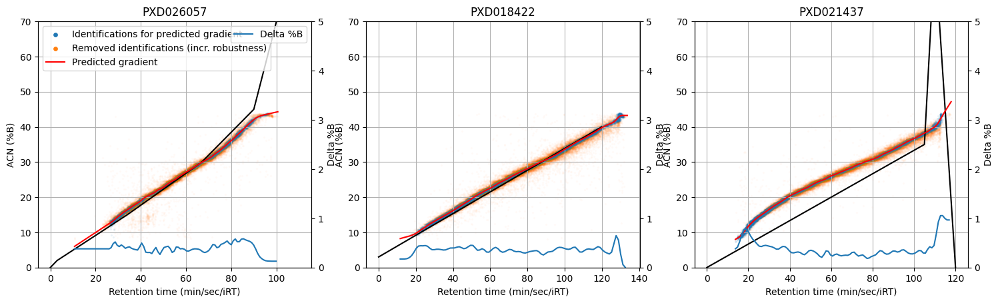

In [23]:
%matplotlib inline

# Define some of the parameters to predict the gradient
verbose = True
plot_emp_derivative = True
n_splines = 50

# Define the plotting area for our predicted gradient
matplotlib.rcParams['figure.figsize'] = [18, 4.8]

# Get a list of all projects we need to iterate over
all_projects = list(set(combined_df["project"]))

# Define a list with locations of each project in three subplot to be plotted
iter_row_nums = [i % 3 for i in range(0,len(list(set(combined_df["project"]))))]

# Iterate over each project and plot location
for sum_idx,(proj,idx) in enumerate(zip(["PXD026057","PXD018422","PXD021437"],iter_row_nums)):
    # If we start with a new plot show the results and prepare a new subplot
    if idx == 0:
        plt.tight_layout()
        plt.show()
        plt.close()
        fig, axs = plt.subplots(1, 3)
        
    if verbose:
        print(f"Analyzing this project ({sum_idx+1}/{len(all_projects)}): {proj}")
    
    # Grab the correct subplot
    ax = axs[idx]
    
    # Get all information for the selected project
    evids_all = combined_evids[combined_evids["project"] == proj]
    
    # Fit a robust regression model (GAM with splines) to map between observed
    # retention times and predicted ACN (%B). This will iteratively fit a regression
    # model and exclude the peptide sequences with the largest error (evids_higher).
    # This ensure we only give weight to those peptide sequences with that are 
    # predicted the most accurately. You can exclude this step, but beware that many
    # observations are noisy (wrong apex) or plain wrong (wrong identification).
    evids, evids_higher, pygam_model = robust_pygam(evids_all,n_splines=n_splines)

    # Fit a regression model (GAM with splines) on the most accurately predicted
    # peptide sequences. This model maps between (uncalibrated) predictions with
    # associated ACN (%B) and observed retention time.
    mod_pygam = fit_pygam(
                    evids["tr"],
                    evids["uncal_preds"],
                    slope=slope,
                    intercept=intercept,
                    n_splines=n_splines,
                    constraints="monotonic_inc"
    )
    
    # Predict the ACN (%B) by mapping them to the predicted gradient
    tr_pred = mod_pygam.predict(evids_all["tr"])
    
    # In addition also predict it for values equidistant from each other
    range_pred = mod_pygam.predict(
                            np.linspace(min([min(evids["tr"]),min(evids_higher["tr"])]),
                            max([max(evids["tr"]),max(evids_higher["tr"])]),1000)
                    )
    
    combined_df.loc[combined_evids["project"] == proj,"ACN_pred"] = tr_pred
    
    # Plot the results
    
    # Set a title
    ax.set_title(proj)
    
    # Scatterplot the retention time against ACN (%B)
    ax.scatter(
        evids["tr"],
        evids["uncal_preds"]*slope+intercept,
        s=2,
        alpha=0.05,
        label = "Identifications for predicted gradient"
    )
    
    # Scatterplot the retention time against ACN (%B)
    ax.scatter(
        evids_higher["tr"],
        evids_higher["uncal_preds"]*slope+intercept,
        s=2,
        alpha=0.02,
        label = "Removed identifications (incr. robustness)"
    )

    ax.plot(
        np.linspace(min([min(evids["tr"]),min(evids_higher["tr"])]),max([max(evids["tr"]),max(evids_higher["tr"])]),1000),
        range_pred,
        alpha=1.0,
        zorder=10,
        c="red",
        label = "Predicted gradient"
    )
    
    ax.set_xlabel("Retention time (min/sec/iRT)")
    ax.set_ylabel("ACN (%B)")
    ax.set_ylim(0,70)
    ax.grid()
    
    if idx == 0:
        ax.plot([0,3,34,67,90,110],np.array([0,2,15,30,45,95]),c="black")
    if idx == 1:
        ax.plot([0,120],[3,40],c="black")
    if idx == 2:
        ax.plot([0,105,110,120],[0,35,90,0],c="black")
    
    if plot_emp_derivative:
        ax2=ax.twinx()
        ax2.plot(
            np.linspace(min([min(evids["tr"]),min(evids_higher["tr"])]),max([max(evids["tr"]),max(evids_higher["tr"])]),1000)[::10],
            np.gradient(range_pred[::10]),
            label="Delta %B"
        )
        ax2.set_ylim(0,5)
        ax2.set_ylabel("Delta %B")
        
    if idx == 0:
        leg = ax.legend(loc='upper left')
        leg2 = ax2.legend(loc='upper right')
        for lh in leg.legendHandles:
            lh.set_alpha(1)
            if "set_sizes" in dir(lh):
                lh.set_sizes([15])

In [53]:
evids = pd.read_csv("evidence_ecoli.txt",sep="\t",comment="#")
evids.fillna(0.0,inplace=True)

sel_file = "2022-8-29_Ecoli_65min"

evids = evids[evids["Raw file"] == sel_file]

evids = evids.sort_values("Intensity",ascending=False).drop_duplicates("Modified sequence",keep="first")

In [54]:
evids["modifications"] = evids["Modified sequence"].apply(get_peprec_str)
evids["seq"] = evids["Sequence"]
evids["tr"] = evids["Calibrated retention time"]

evids.sort_values("tr",inplace=True)
evids.fillna("",inplace=True)
evids["seq"] = evids["seq"].apply(sanatize_input)

1/1 [==============================] - 1s 861ms/step


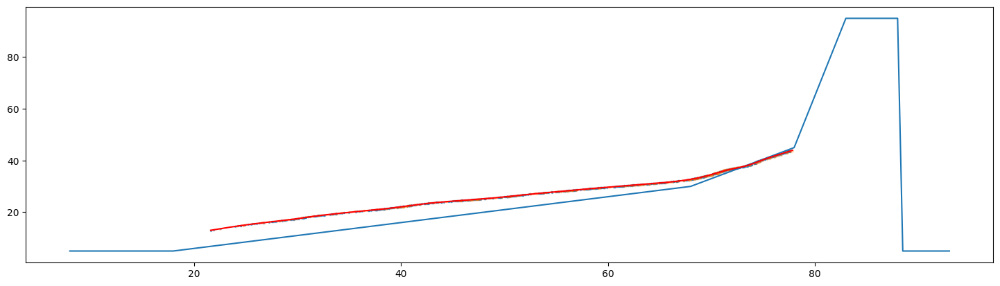

In [59]:
evids_all = get_grad(
            evids,
            sel_file="",
            slope=slope,
            intercept=intercept,
            filter_intens=False,
            prep_deeplc=False
        )

# Fit a robust regression model (GAM with splines) to map between observed
# retention times and predicted ACN (%B). This will iteratively fit a regression
# model and exclude the peptide sequences with the largest error (evids_higher).
# This ensure we only give weight to those peptide sequences with that are 
# predicted the most accurately. You can exclude this step, but beware that many
# observations are noisy (wrong apex) or plain wrong (wrong identification).
evids, evids_higher, pygam_model = robust_pygam(evids_all,n_splines=n_splines)

# Fit a regression model (GAM with splines) on the most accurately predicted
# peptide sequences. This model maps between (uncalibrated) predictions with
# associated ACN (%B) and observed retention time.
mod_pygam = fit_pygam(
                evids["tr"],
                evids["uncal_preds"],
                slope=slope,
                intercept=intercept,
                n_splines=n_splines,
                constraints="monotonic_inc"
)

# Predict the ACN (%B) by mapping them to the predicted gradient
tr_pred = mod_pygam.predict(evids_all["tr"])

# In addition also predict it for values equidistant from each other
range_pred = mod_pygam.predict(
                        np.linspace(min([min(evids["tr"]),min(evids_higher["tr"])]),
                        max([max(evids["tr"]),max(evids_higher["tr"])]),1000)
                )

#combined_df.loc[combined_evids["project"] == proj,"ACN_pred"] = tr_pred

# Plot the results

# Scatterplot the retention time against ACN (%B)
plt.scatter(
    evids["tr"],
    evids["uncal_preds"]*slope+intercept,
    s=2,
    alpha=0.5,
    label = "Identifications for predicted gradient"
)

# Scatterplot the retention time against ACN (%B)
plt.scatter(
    evids_higher["tr"],
    evids_higher["uncal_preds"]*slope+intercept,
    s=2,
    alpha=0.2,
    label = "Removed identifications (incr. robustness)"
)

plt.plot(
    np.linspace(min([min(evids["tr"]),min(evids_higher["tr"])]),max([max(evids["tr"]),max(evids_higher["tr"])]),1000),
    range_pred,
    alpha=1.0,
    zorder=10,
    c="red",
    label = "Predicted gradient"
)

#plt.plot(
#    [0,10,115,130,140,150,150.1,160],np.array([5,5,27.5,40,95,95,5,5])*0.8,c="black"
#)
plt.plot(
    np.array([0,10,60,70,75,80,80.5,85])+8,[5,5,30,45,95,95,5,5]
)
plt.show()

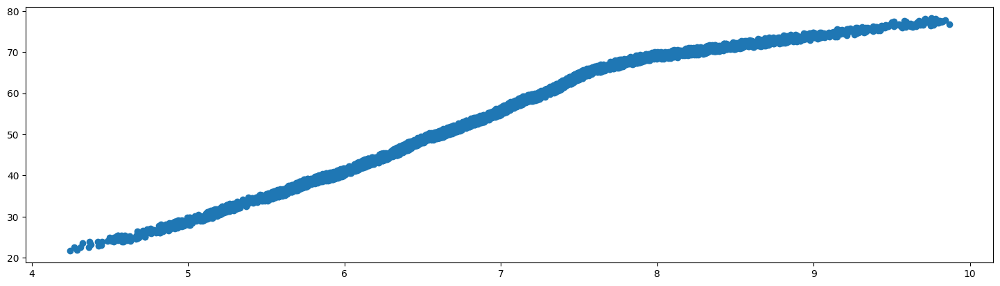

In [57]:
plt.scatter(evids_all["uncal_preds"],evids_all["tr"])